In [51]:
#Importing necessary libraries
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import time
import plotly.offline as py
import plotly.express as px
from plotly.offline import plot
import yfinance as yf
import matplotlib.dates as mdates
from datetime import datetime 
from sklearn.linear_model import LinearRegression
from sklearn.neighbors import KNeighborsRegressor
from sklearn.model_selection import train_test_split,KFold,cross_val_score
from sklearn.tree import DecisionTreeRegressor
from sklearn.svm import SVR
import warnings
warnings.filterwarnings("ignore")

In [2]:
tickers = ['ICICIBANK.NS','BAJAJFINSV.NS','BAJFINANCE.NS','HDFCBANK.NS','KOTAKBANK.NS','SBIN.NS','INDUSINDBK.NS','AXISBANK.NS','BANKBARODA.NS','CANBK.NS']
company_name = ['ICICIBANK','BAJAJFINSV','BAJAJ_FINANCE','HDFC_BANK','KOTAK_BANK','SBI_BANK','INDUSIND_BANK','AXIS_BANK',"BANK_OF_BARODA","CANARA_BANK"]

In [3]:
##Downloading datasets
start = '2008-01-01'
end = '2020-12-31'
for i,compny in enumerate(company_name):
    globals()[compny] = yf.download(tickers[i],start,end)

[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed
[*********************100%***********************]  1 of 1 completed


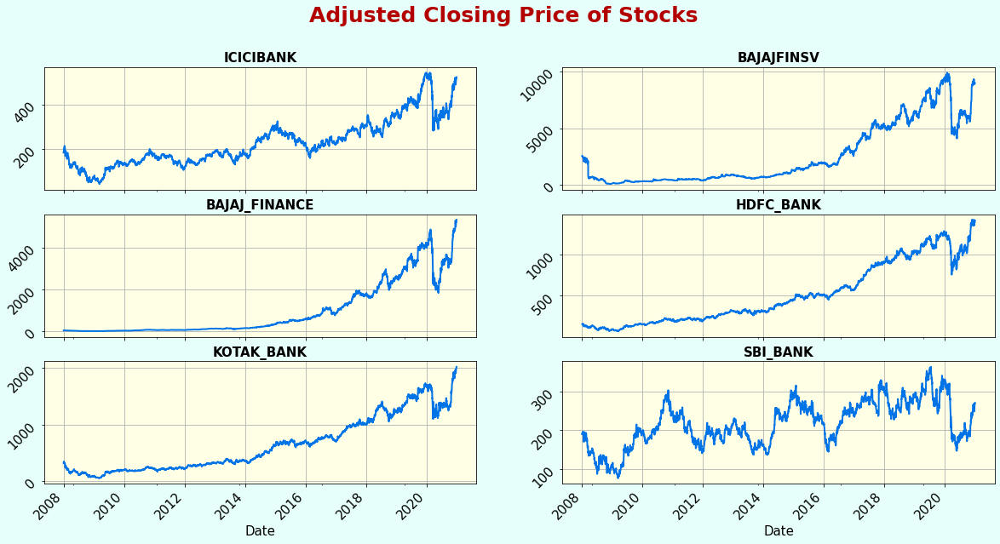

In [4]:
#Plotting Adjusting closing prices of stocks
f,ax = plt.subplots(3,2,figsize = (20,10),sharex = True,facecolor = "#e6fffa")
f.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
f.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.suptitle("Adjusted Closing Price of Stocks",fontsize=25,color = '#b30000',fontweight ="bold")
#plot_c=["g","r",'#004080',"#b3003b",'#000d1a','#e6005c',"#b30059",'#0073e6','#ff471a',"r"]
fc=["#e6e6ff","#cce5ff","#ffebcc",'#d8e5f3','#ccffcc','#ffd9cc','#ffffe6',"#ffe6f2",'#f7ffe6','#fff5e6']
n=0
for i in range(ax.shape[0]):
    for j in range(ax.shape[1]):
        globals()[company_name[n]]["Adj Close"].plot(ax=ax[i,j],color='#0073e6',linewidth=2)
        ax[i,j].grid(True)
        ax[i,j].set_xlabel('Date', fontsize = 15)
        ax[i,j].set_facecolor('#ffffe6')
        ax[i,j].tick_params(labelrotation = 45,labelsize=15)
        ax[i,j].set_title(company_name[n],fontweight="bold",fontsize=15)
        n+=1
       
        

        


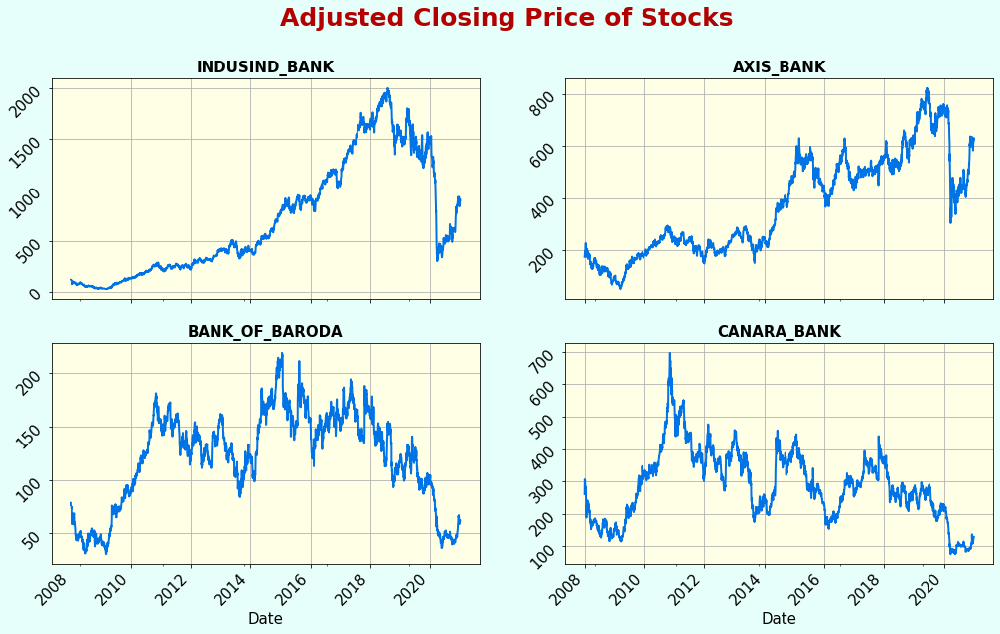

In [5]:
g,az = plt.subplots(2,2,figsize = (17,10),sharex = True,facecolor = "#e6fffa")
g.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m"))
g.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.suptitle("Adjusted Closing Price of Stocks",fontsize=25,color = '#b30000',fontweight ="bold")


for i in range(az.shape[0]):
    for j in range(az.shape[1]):
        globals()[company_name[n]]["Adj Close"].plot(ax=az[i,j],color='#0073e6',linewidth=2)
        az[i,j].grid(True)
        az[i,j].set_xlabel('Date', fontsize = 15)
        az[i,j].set_facecolor('#ffffe6')
        az[i,j].tick_params(labelrotation = 45,labelsize=15)
        az[i,j].set_title(company_name[n],fontweight="bold",fontsize=15)
        n+=1

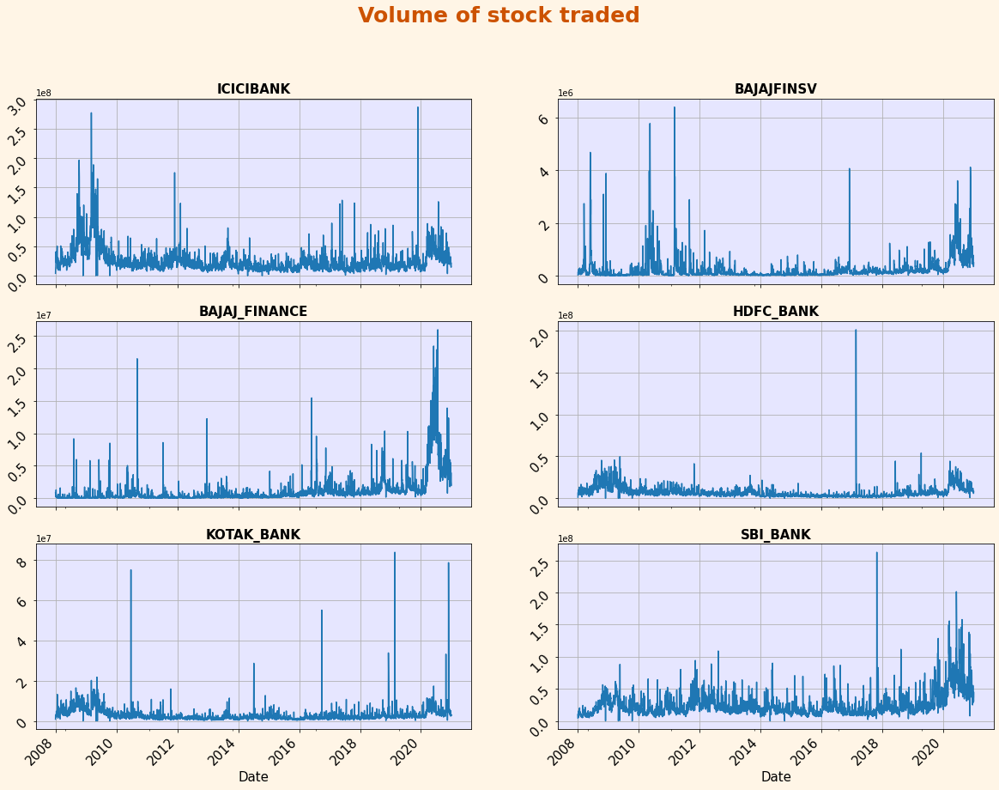

In [6]:
h,aa = plt.subplots(3,2,figsize = (20,15),facecolor='#fff5e6',sharex = True)
h.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
h.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.suptitle("Volume of stock traded",fontsize=25,color = '#cc5200',fontweight ="bold")
n = 0

for i in range(aa.shape[0]):
    for j in range(aa.shape[1]):
        globals()[company_name[n]]["Volume"].plot(ax=aa[i,j])
        aa[i,j].grid(True)
        aa[i,j].set_xlabel('Date', fontsize = 15)
        aa[i,j].set_facecolor("#e6e6ff")
        aa[i,j].tick_params(labelrotation = 45,labelsize=15)
        aa[i,j].set_title(company_name[n],fontweight="bold",fontsize=15)
        n+=1
        
 

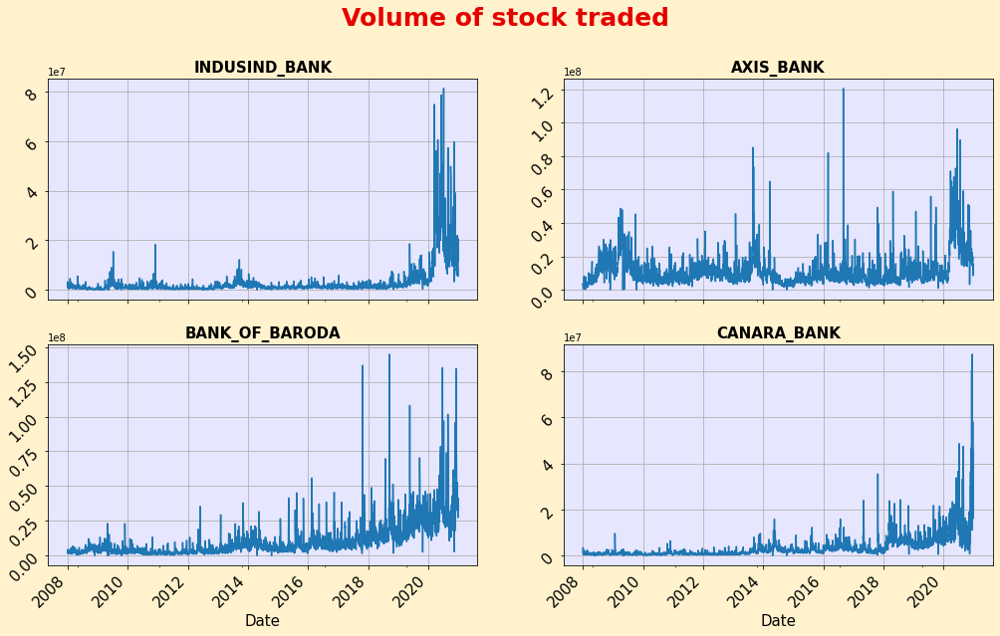

In [7]:

f1,ab = plt.subplots(2,2,figsize=(17,10),sharex = True,facecolor = "#fff2cc")
f1.gca().xaxis.set_major_formatter(mdates.DateFormatter("%Y-%m-%d"))
f1.gca().xaxis.set_major_locator(mdates.YearLocator())
plt.suptitle("Volume of stock traded",fontsize=25,color = '#e60000',fontweight ="bold")

for i in range(ab.shape[0]):
    for j in range(ab.shape[1]):
        globals()[company_name[n]]["Volume"].plot(ax=ab[i,j])
        ab[i,j].grid(True)
        ab[i,j].set_xlabel('Date', fontsize = 15)
        ab[i,j].set_facecolor("#e6e6ff")
        ab[i,j].tick_params(labelrotation = 45,labelsize=15)
        ab[i,j].set_title(company_name[n],fontweight="bold",fontsize=15)
        n+=1

## Calculating moving Averages for stocks

In [8]:
ma=[50,150,250]

for m in ma:
    for company in company_name:
        column_name = f"MA for {m} days"
        globals()[company][column_name] = globals()[company]['Close'].rolling(m).mean()

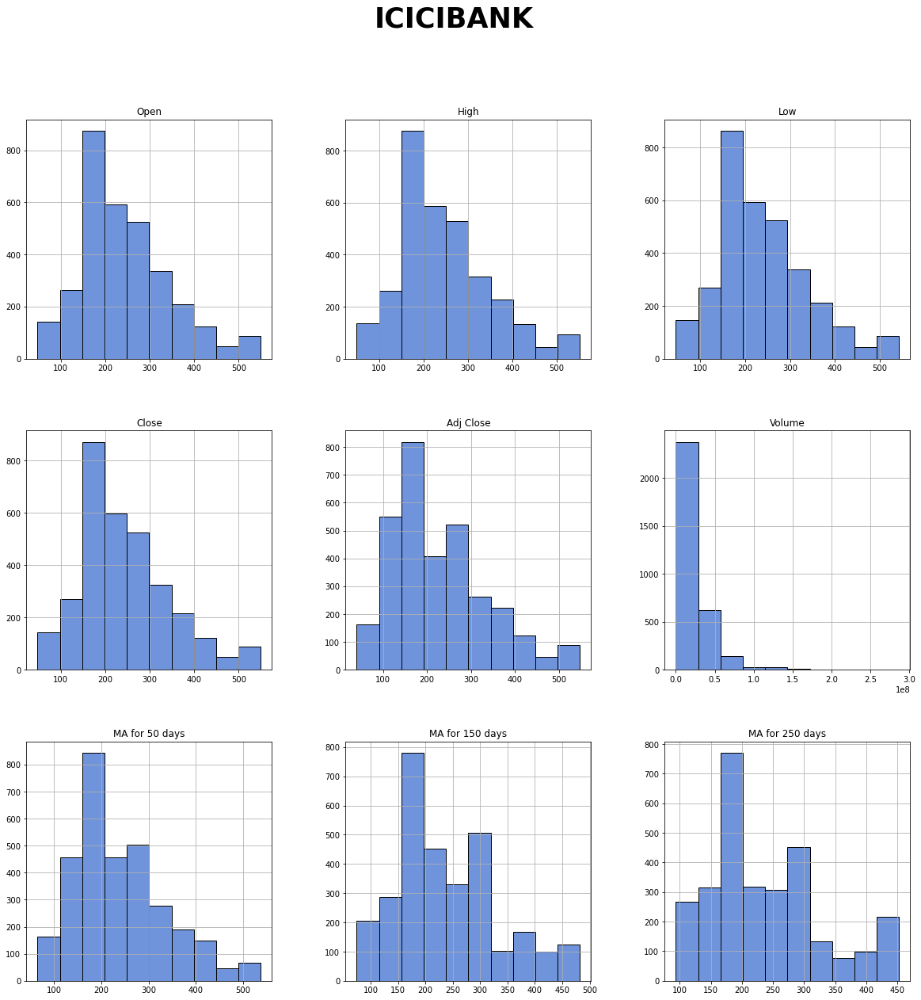

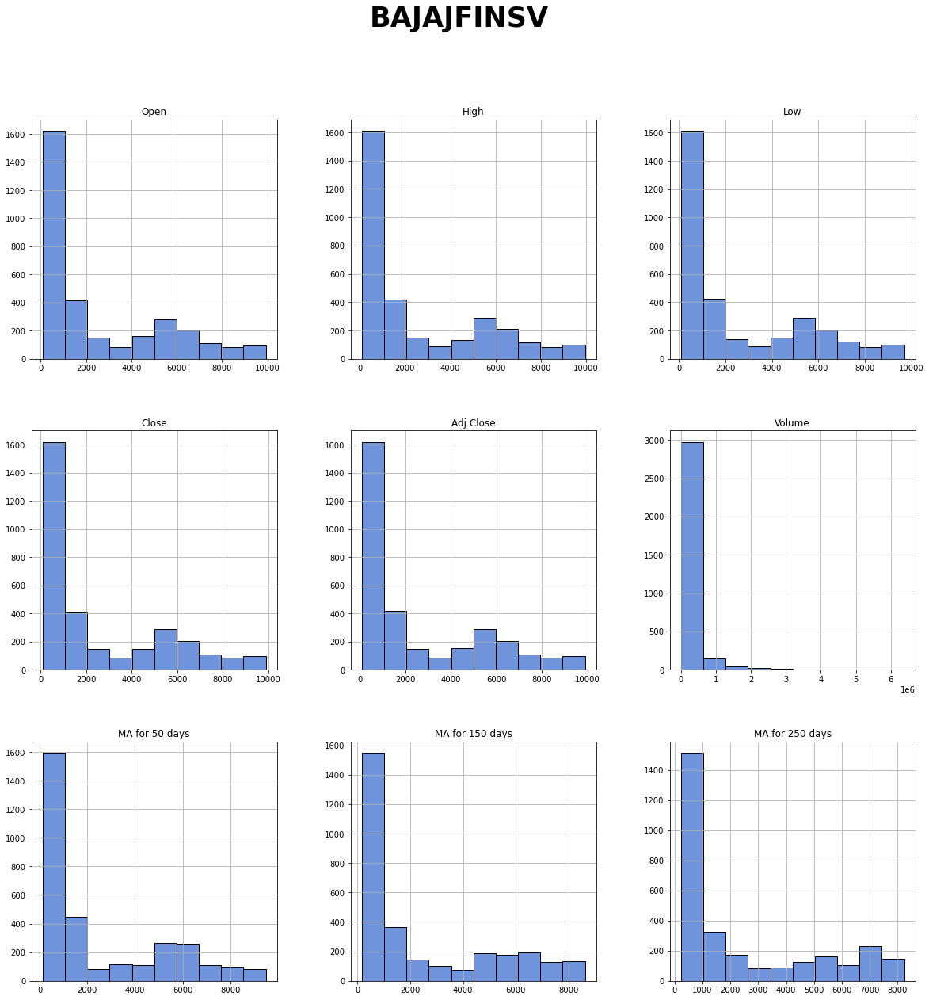

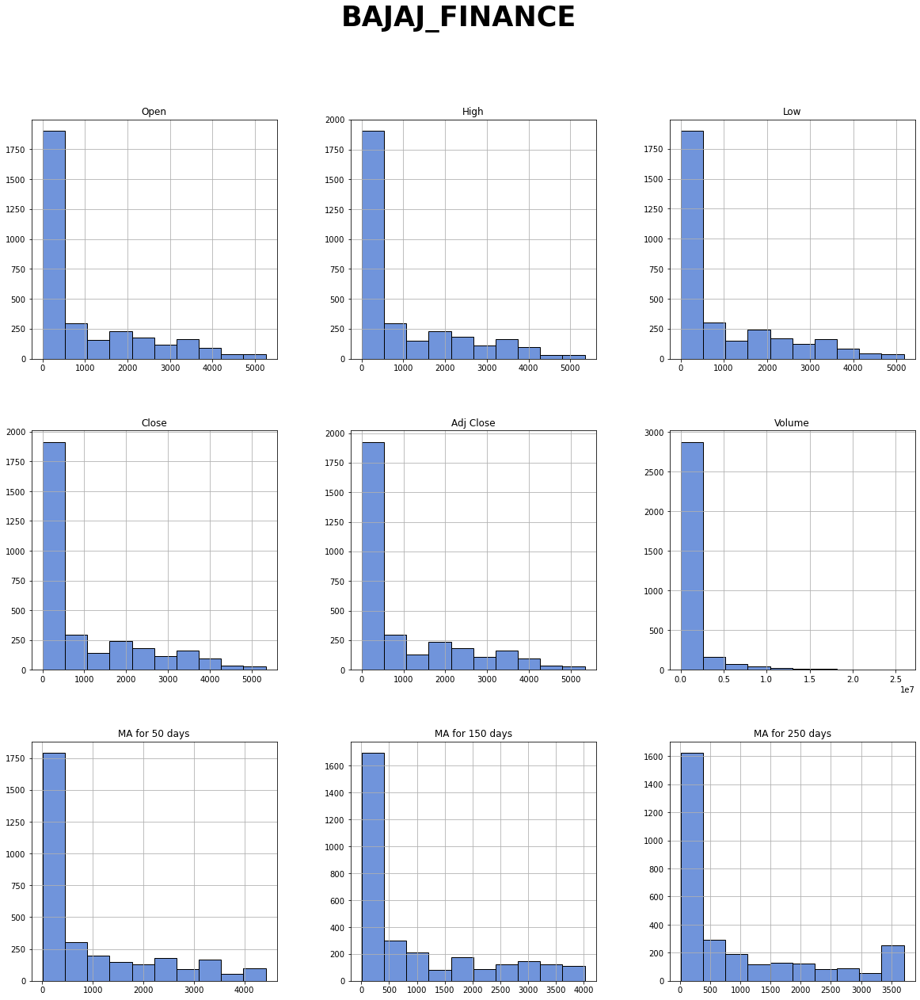

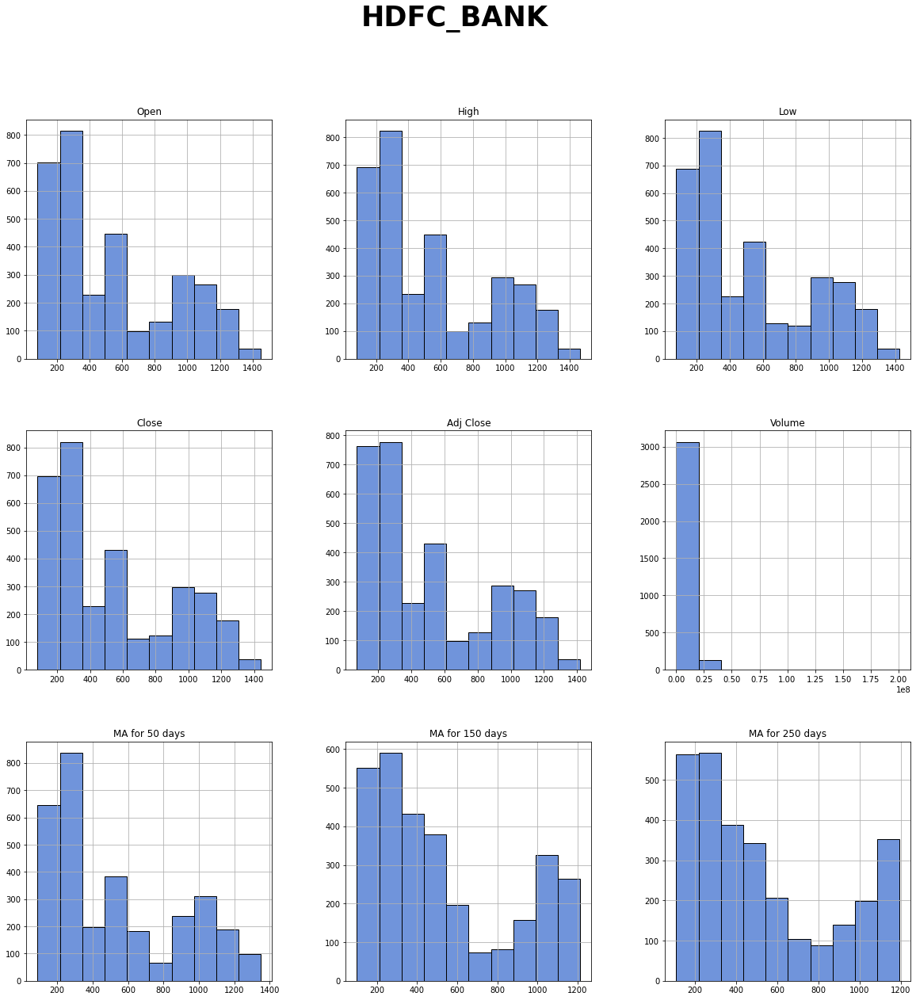

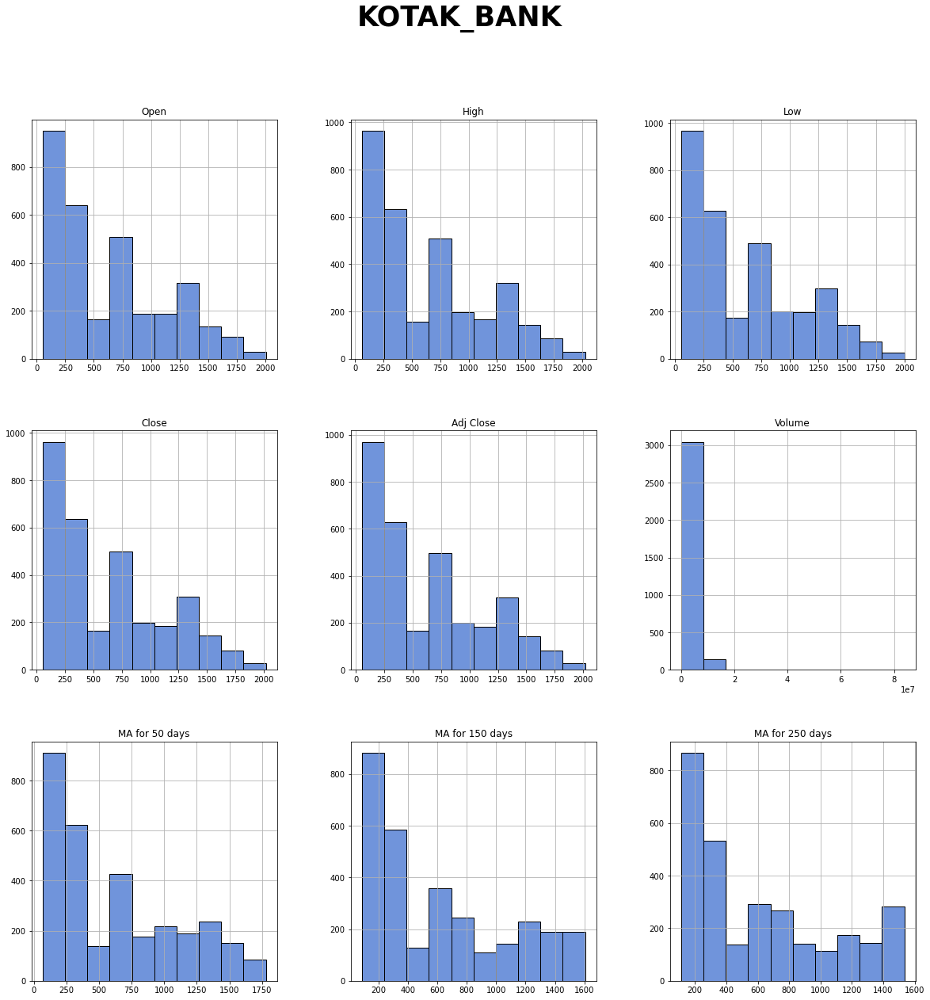

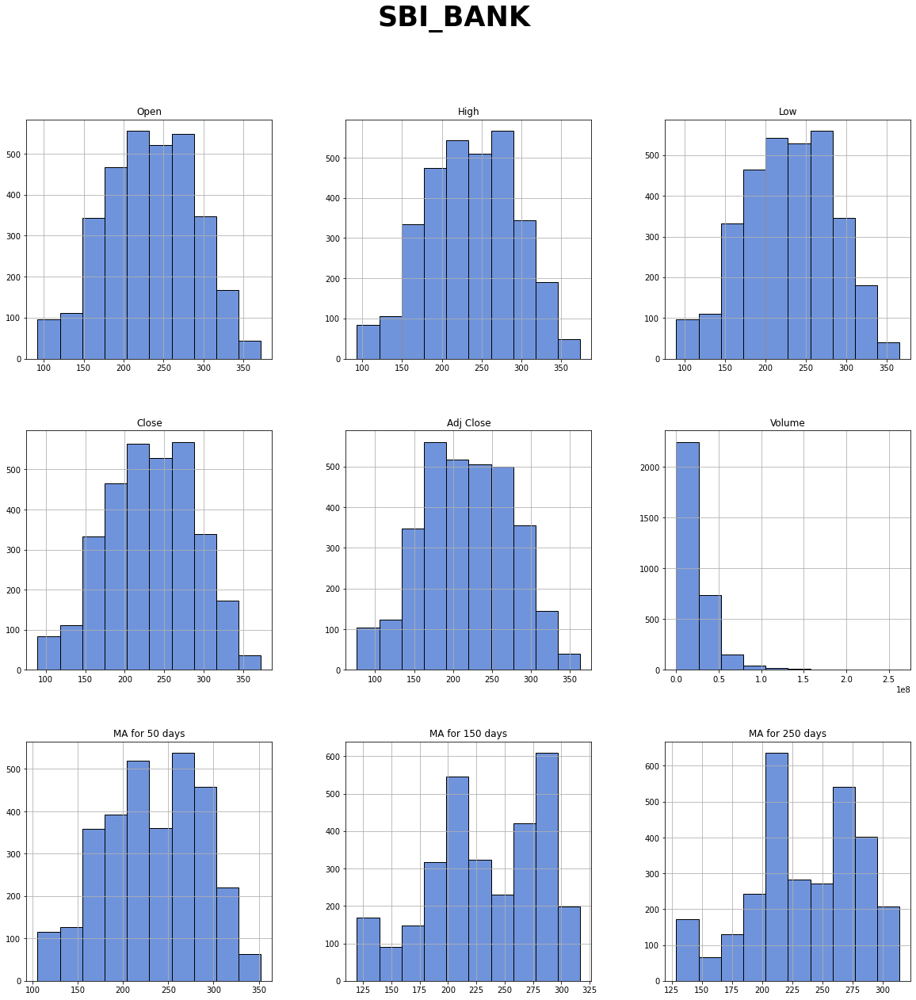

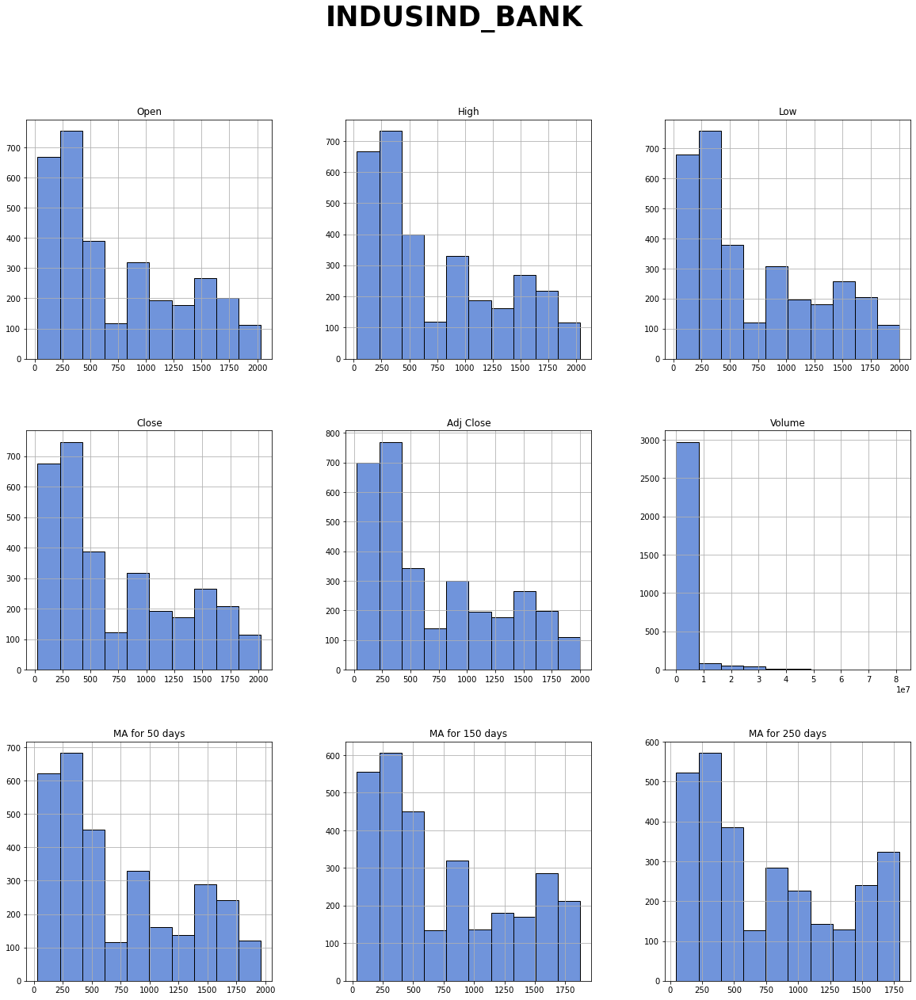

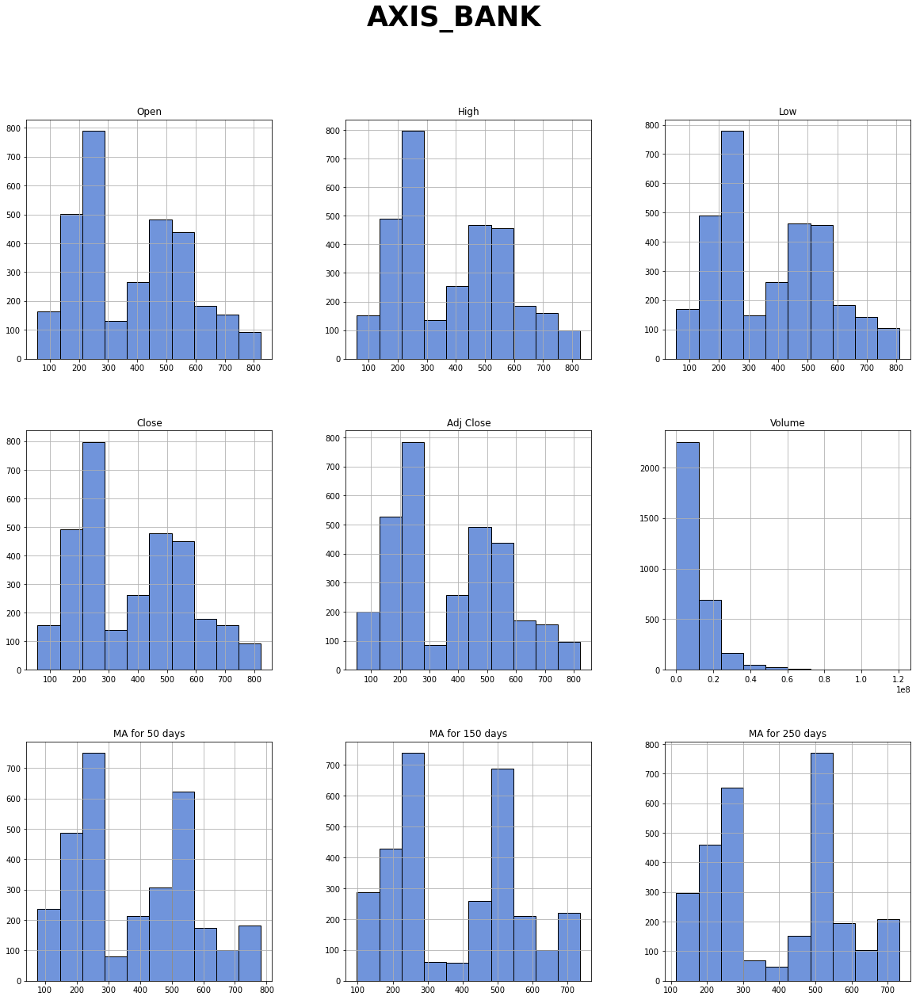

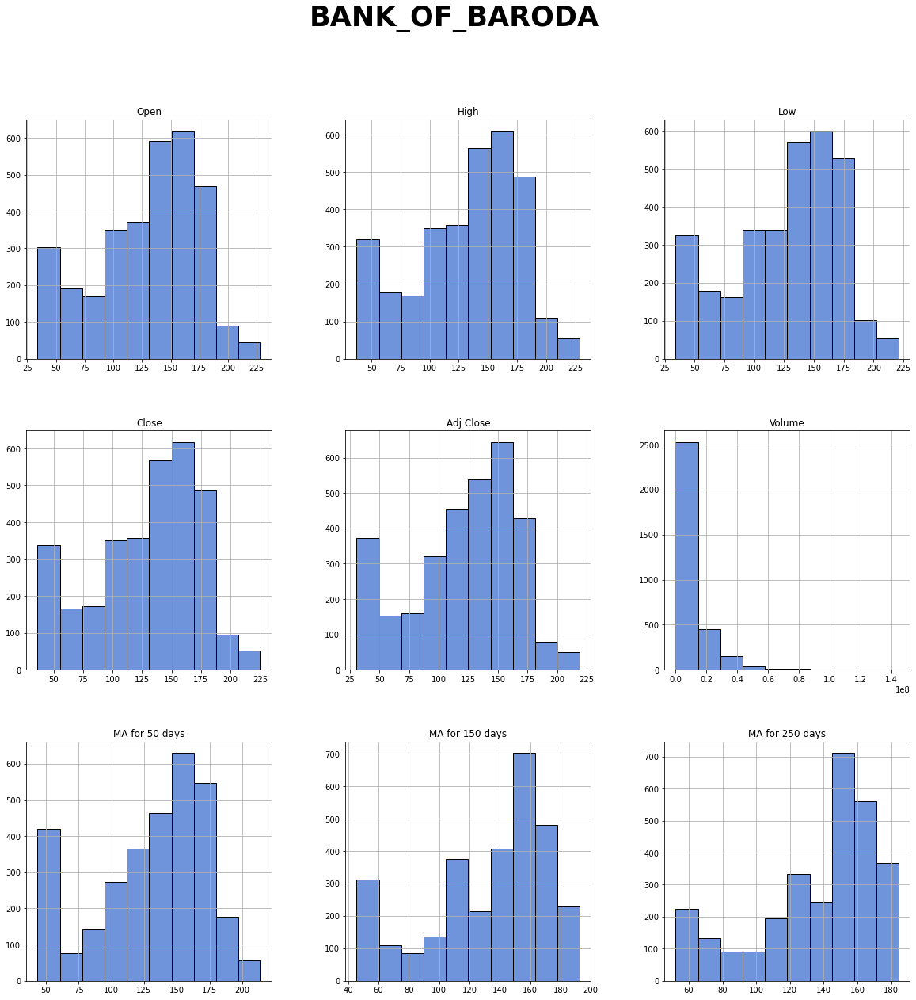

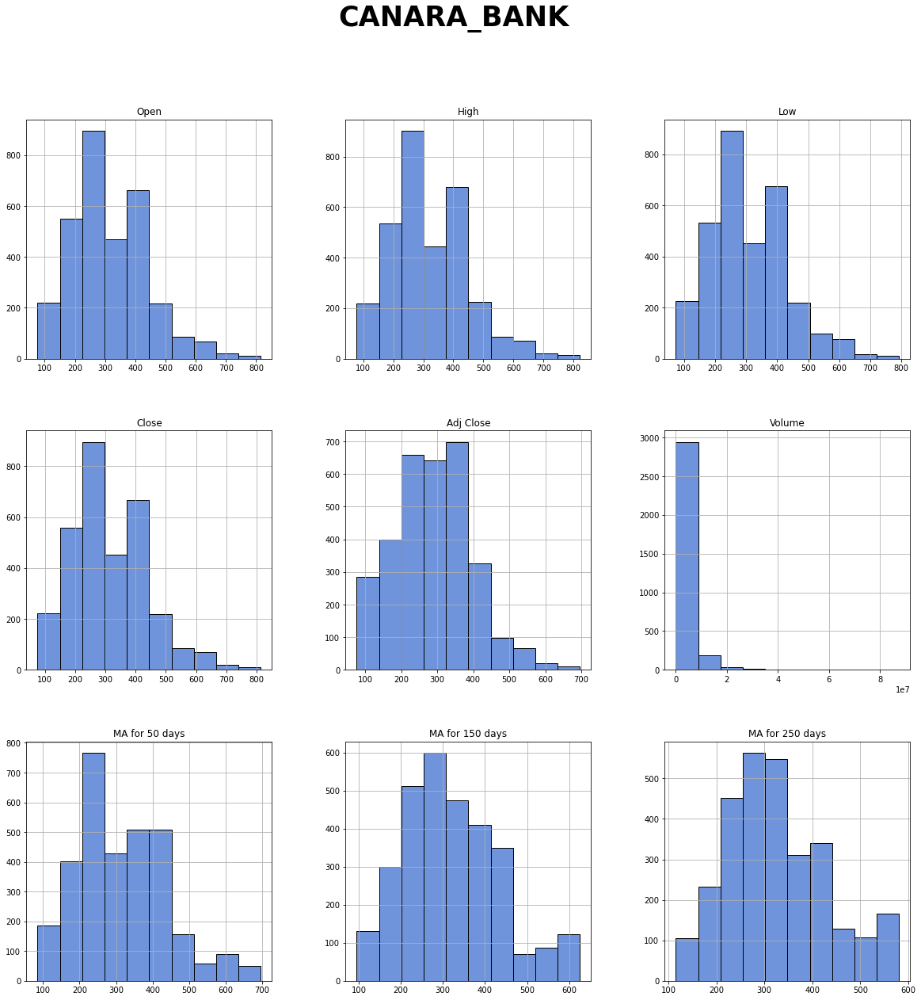

In [9]:
for i,cmpny in enumerate(company_name,1):
    globals()[cmpny].hist(figsize = (20,20),color="#7094db",ec = "#000000")
    plt.suptitle(f"{company_name[i-1]}",fontweight="bold",fontsize=35)

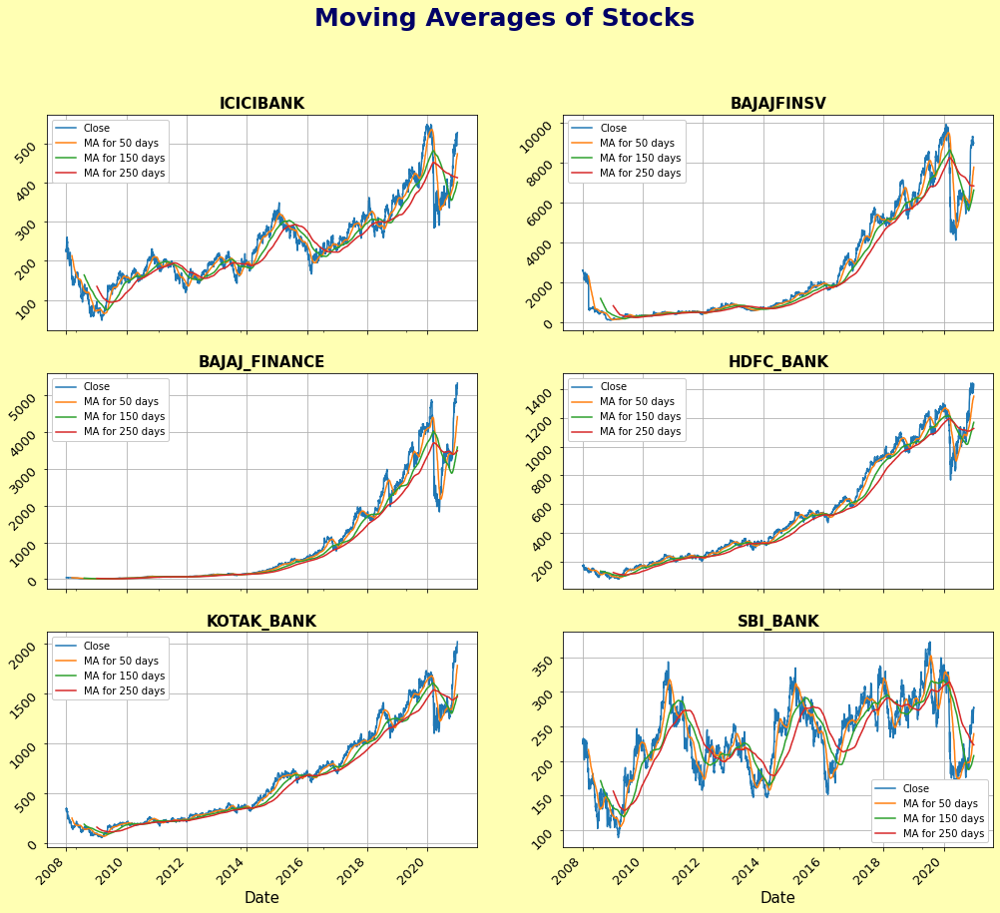

In [10]:
fig,az = plt.subplots(nrows=3,ncols=2,facecolor = "#ffffb3",sharex=True,figsize=(17,15))
#fig.set_figheight(17)
#fig.set_figwidth(20)
fig.suptitle("Moving Averages of Stocks",fontsize=25,color = '#000066',fontweight ="bold")
n=0
for i in range(az.shape[0]):
    for j in range(az.shape[1]):
        globals()[company_name[n]][["Close",'MA for 50 days',"MA for 150 days","MA for 250 days"]].plot(ax=az[i,j])
        az[i,j].grid(True)
        az[i,j].set_xlabel('Date', fontsize = 15)
        az[i,j].legend(facecolor="white",framealpha=1)
        az[i,j].tick_params(labelrotation = 45,labelsize=13)
        az[i,j].set_title(company_name[n],fontweight="bold",fontsize=15)
        n+=1

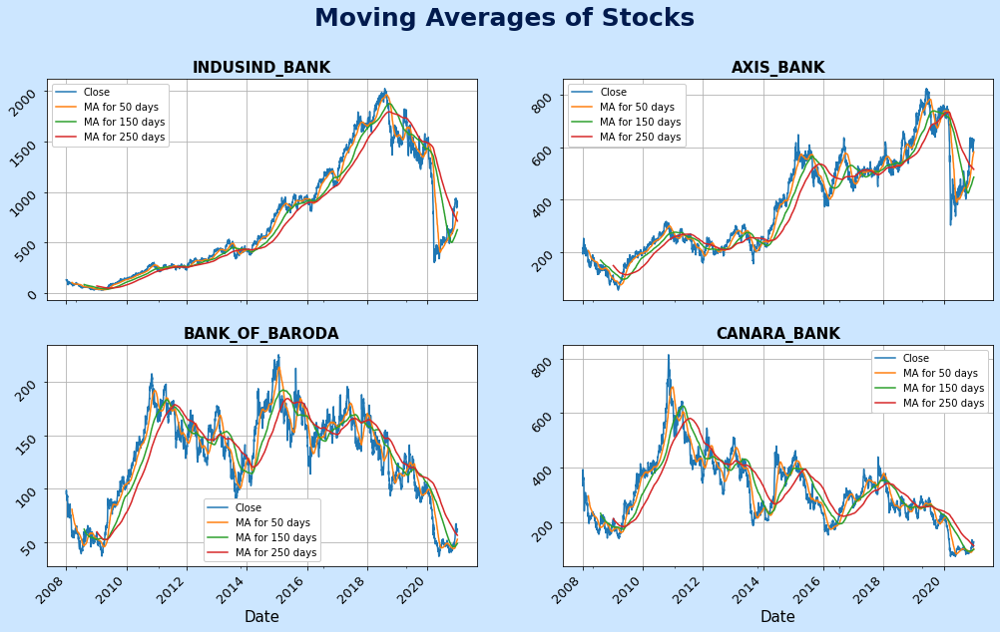

In [11]:
fig,ac = plt.subplots(nrows=2,ncols=2,facecolor = "#cce6ff",figsize=(17,10),sharex=True)
fig.suptitle("Moving Averages of Stocks",fontsize=25,color = '#001a4d',fontweight ="bold")
for i in range(ac.shape[0]):
    for j in range(ac.shape[1]):
        globals()[company_name[n]][["Close",'MA for 50 days',"MA for 150 days","MA for 250 days"]].plot(ax=ac[i,j])
        ac[i,j].grid(True)
        ac[i,j].set_xlabel('Date', fontsize = 15)
        #az[i,j].set_facecolor("#e6e6ff")
        ac[i,j].tick_params(labelrotation = 45,labelsize=13)
        ac[i,j].legend(facecolor="white",framealpha=1)
        ac[i,j].set_title(company_name[n],fontweight="bold",fontsize=15)
        n+=1

In [12]:
for company in company_name:
    globals()[company]['Daily Return'] = globals()[company]['Adj Close'].pct_change()

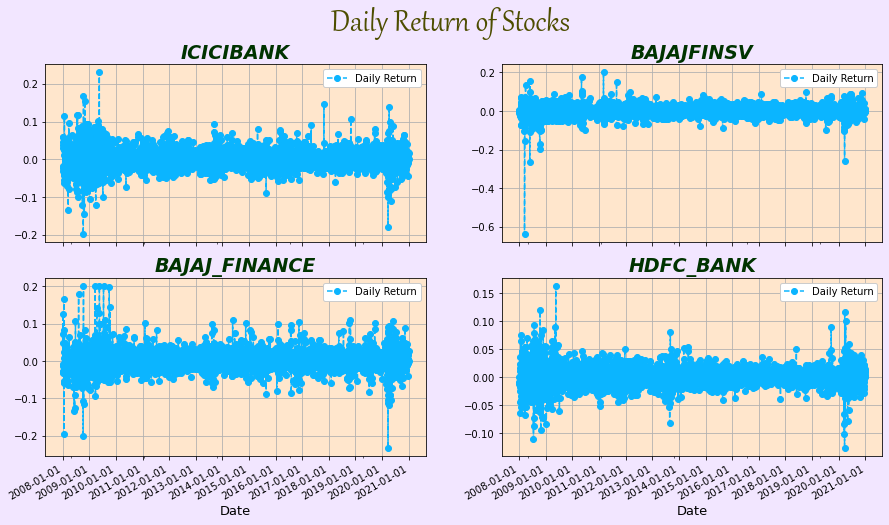

In [13]:
fig, axs = plt.subplots(nrows=2, ncols=2,facecolor = "#f2e6ff",sharex=True)
fig.set_figheight(8)
fig.set_figwidth(15)
fig.suptitle("Daily Return of Stocks",fontsize=35,color = '#4d4d00',fontweight ="bold",fontname="Gabriola")
n=0

for i in range(axs.shape[0]):
    for j in range(axs.shape[1]):
        globals()[company_name[n]]["Daily Return"].plot(ax=axs[i,j],legend=True,linestyle='--',marker = "o",color = "#0BB5FF")

        axs[i,j].grid(True)
        axs[i,j].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        axs[i,j].xaxis.set_major_locator(mdates.YearLocator())
        axs[i,j].legend(facecolor="white",framealpha=1)
        axs[i,j].set_facecolor("#ffe6cc")
        axs[i,j].set_title(f"{company_name[n]}",fontweight = 'bold',style='italic',fontsize=19,color = "#003300")
        axs[i,j].set_xlabel("Date",fontsize = 13)
        n+=1

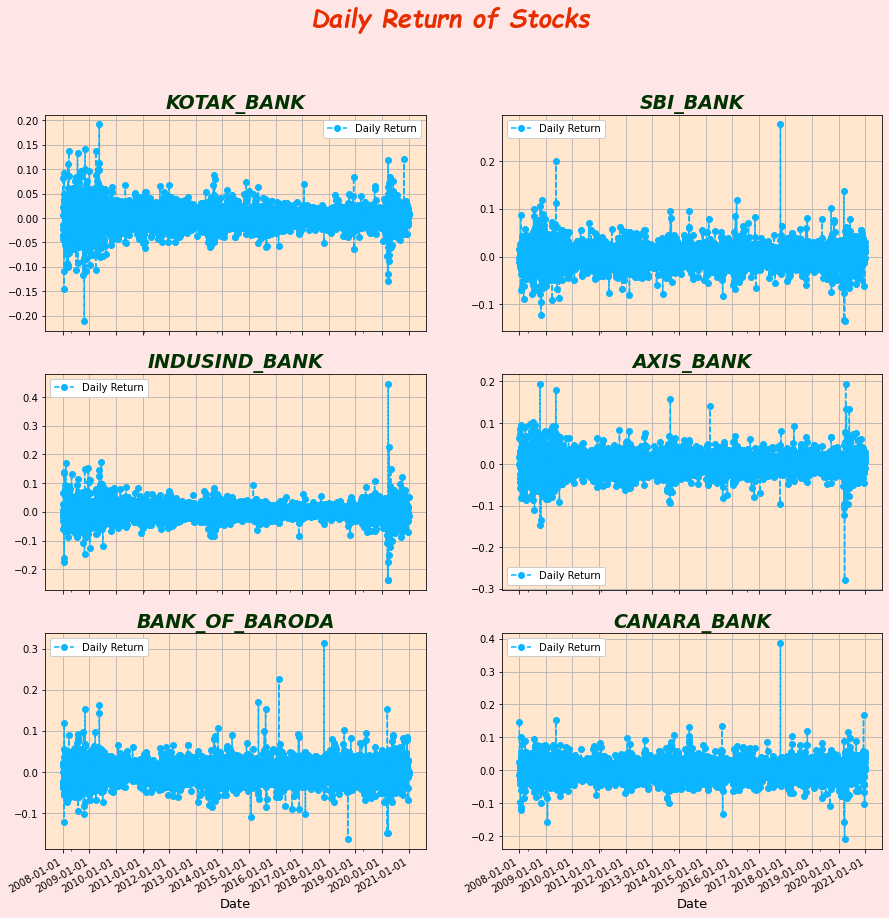

In [14]:
fig, axx = plt.subplots(nrows=3, ncols=2,facecolor = "#ffe6e6",sharex=True)
fig.set_figheight(15)
fig.set_figwidth(15)
fig.suptitle("Daily Return of Stocks",fontsize=25,color = '#e62e00',fontweight ="bold",fontname="Comic Sans MS",style = "italic")

for i in range(axx.shape[0]):
    for j in range(axx.shape[1]):
        globals()[company_name[n]]["Daily Return"].plot(ax=axx[i,j],legend=True,linestyle='--',marker = "o",color = "#0BB5FF")

        axx[i,j].grid(True)
        axx[i,j].xaxis.set_major_formatter(mdates.DateFormatter('%Y-%m-%d'))
        axx[i,j].xaxis.set_major_locator(mdates.YearLocator())
        axx[i,j].legend(facecolor="white",framealpha=1)
        axx[i,j].set_facecolor("#ffe6cc")
        axx[i,j].set_title(f"{company_name[n]}",fontweight = 'bold',style='italic',fontsize=19,color = "#003300")
        axx[i,j].set_xlabel("Date",fontsize = 13)
        n+=1

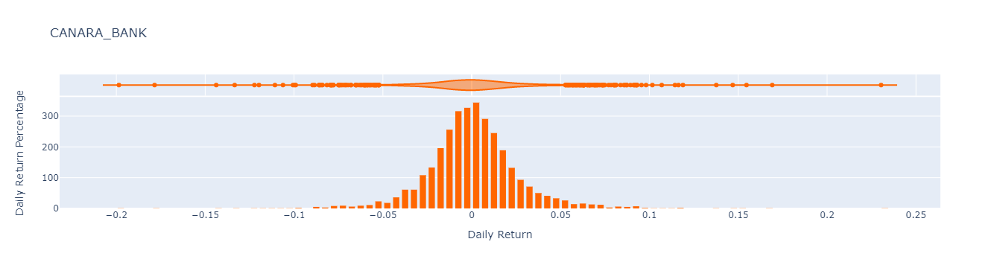

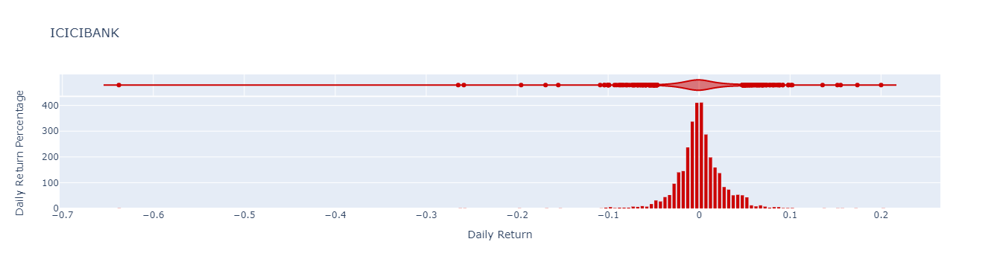

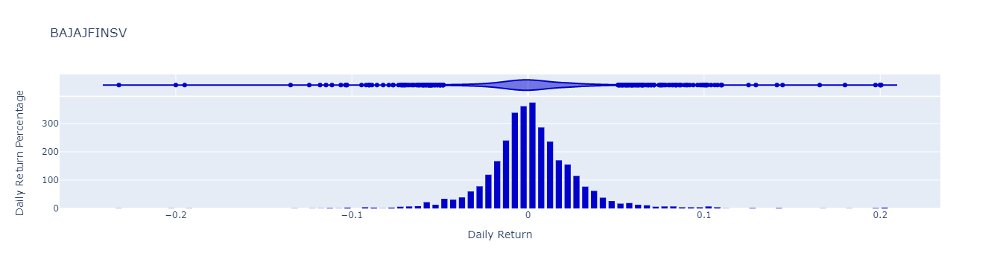

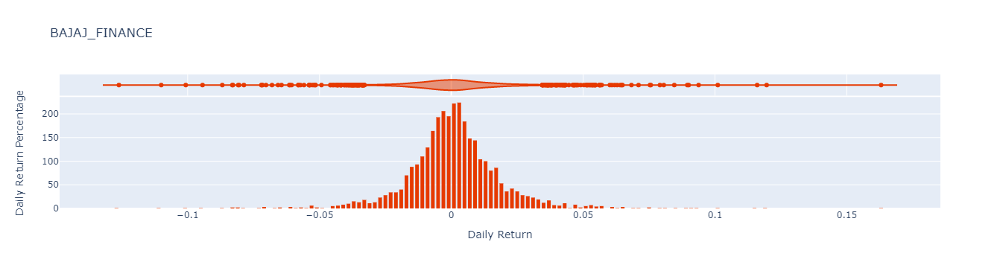

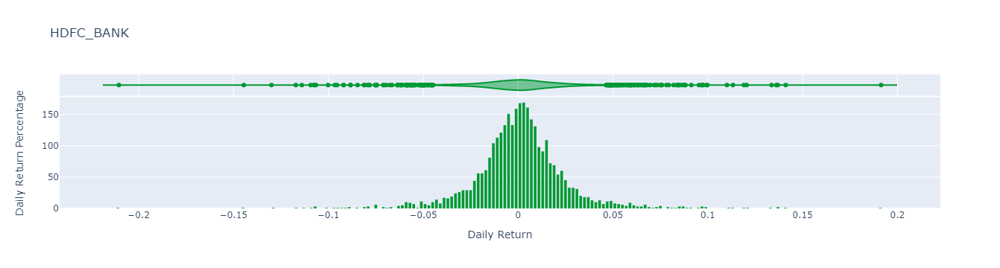

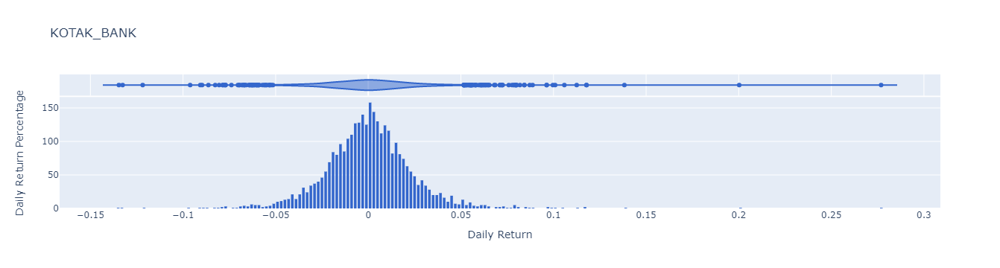

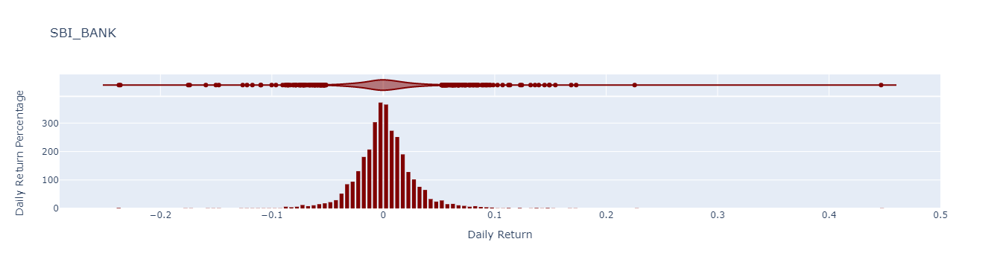

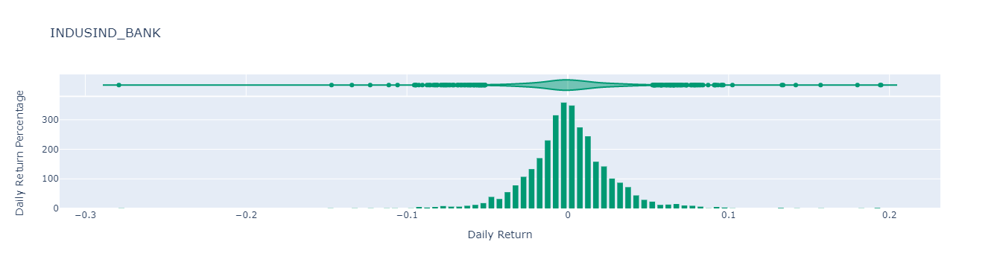

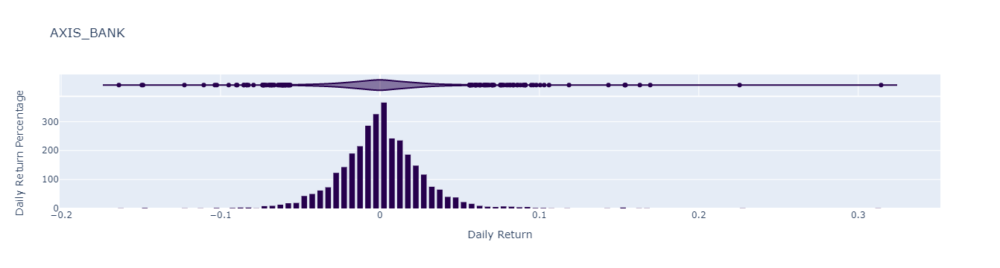

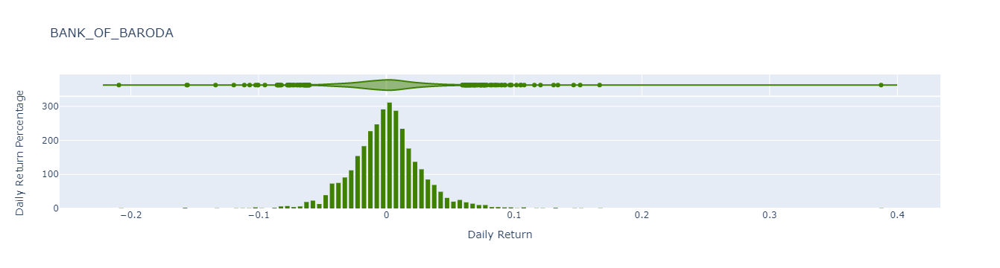

In [15]:
color = ['#cc0000','#0000cc','#e63900','#009933','#3366cc','#800000','#009973','#26004d','#408000','#ff6600']

for i, company in enumerate(company_name):
    fig = px.histogram(data_frame=globals()[company_name[i]],x=globals()[company_name[i]]["Daily Return"].dropna(),marginal = "violin",labels={"value":"Daily Return"},title=f'{company_name[i - 1]}',color_discrete_sequence=[f'{color[i-1]}'])
    fig.update_traces(autobinx=True, selector=dict(type='histogram'))
    fig.update_layout(xaxis_title_text="Daily Return",yaxis_title_text = "Daily Return Percentage",bargap = 0.3,showlegend = False)
    fig.show()
    time.sleep(3)


In [16]:
closing_df=pd.DataFrame()
for company in company_name:
    closing_df[company] = globals()[company]['Close'].pct_change()
closing_df=closing_df.dropna()

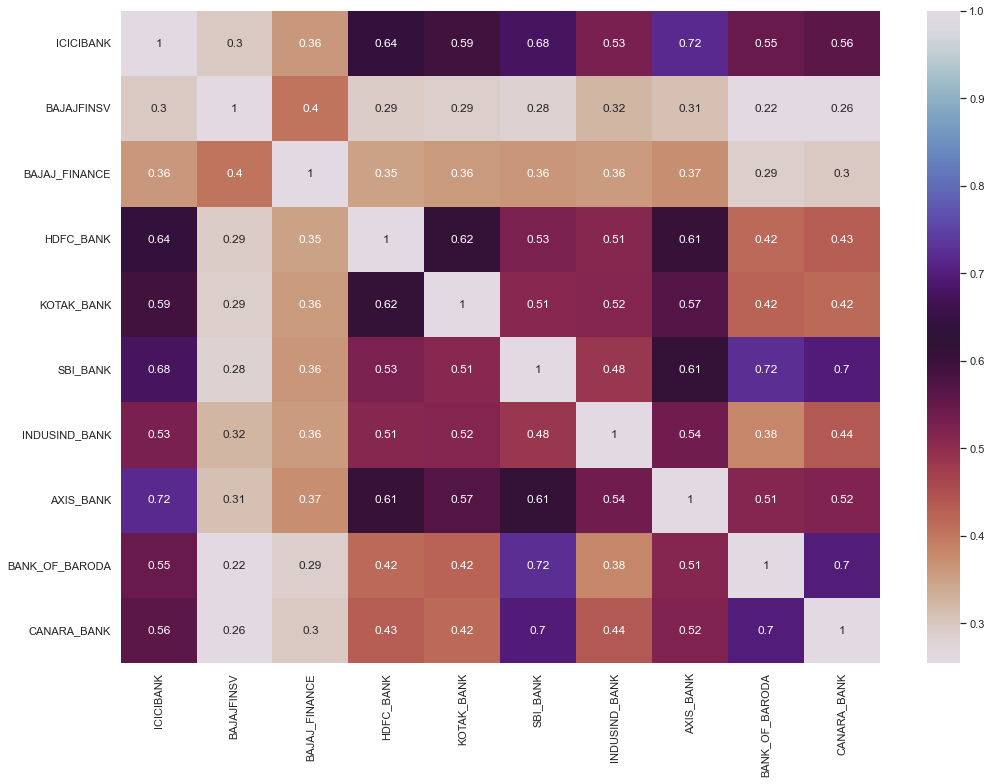

In [17]:
sns.set(rc={'axes.facecolor':'#f0f5f5', 'figure.facecolor':'#ffffff'})

plt.figure(figsize=(17,12))
sns.heatmap(closing_df.corr(), annot=True, cmap='twilight_r',xticklabels=company_name,yticklabels=company_name,robust=True);


